In [114]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 

import missingno as msno

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor 
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.model_selection import cross_val_score, RandomizedSearchCV
import xgboost 

# 1. Loading Datasets

In [115]:
# Load the train dataset
train = pd.read_csv("/home/moni/Senior ML Competition/train.csv")
train.head()

,UID,col_0,col_1,col_2,col_3,col_4,col_5,col_6,y
0,0,A 0,B0,C2,D1,100,E1,F2,237000
1,1,A1,B0,C11,D4,100,E4,F2,86193
2,2,A0,B0,C18,D0,0,E0,F2,169200
3,3,A2,B0,C11,D1,100,E1,F2,58000
4,4,A0,B0,C67,D1,0,E1,F2,235000


In [116]:
# Load the test dataset 
test = pd.read_csv("/home/moni/Senior ML Competition/test.csv")
test.head() 

,UID,col_0,col_1,col_2,col_3,col_4,col_5,col_6
0,2628,A0,B0,C11,D1,100,E1,F2
1,2629,A0,B0,C11,D1,0,E1,F2
2,2630,A0,B0,C11,D1,100,E1,F2
3,2631,A0,B0,C26,D1,100,E1,F0
4,2632,A0,B0,C11,D1,100,E1,NaN


# 2. Drop "UID" column in both train and test dataset

In [117]:
# Dropping unnecessary columns "UID" from train dataset 
train = train.drop(['UID'], axis=1)  

# Dropping unnecessary columns "UID" from test dataset  
test = test.drop(['UID'], axis=1) 
train.head() 

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,y
0,A 0,B0,C2,D1,100,E1,F2,237000
1,A1,B0,C11,D4,100,E4,F2,86193
2,A0,B0,C18,D0,0,E0,F2,169200
3,A2,B0,C11,D1,100,E1,F2,58000
4,A0,B0,C67,D1,0,E1,F2,235000


# 3. Datasets Overview

In [118]:
# shape of train and test dataset 
print("Shape of train is :", train.shape, "\n", "Shape of test is :", test.shape) 

Shape of train is : (2628, 8) 
 Shape of test is : (1127, 7)


In [119]:
# checking data types of each column in train dataset
train.dtypes

col_0    object
col_1    object
col_2    object
col_3    object
col_4     int64
col_5    object
col_6    object
y         int64
dtype: object

In [120]:
# checking data types of each column in test dataset
test.dtypes

col_0    object
col_1    object
col_2    object
col_3    object
col_4     int64
col_5    object
col_6    object
dtype: object

In [121]:
# information of train dataset 
train.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2628 entries, 0 to 2627
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   col_0   2489 non-null   object
 1   col_1   2542 non-null   object
 2   col_2   2628 non-null   object
 3   col_3   2628 non-null   object
 4   col_4   2628 non-null   int64 
 5   col_5   2628 non-null   object
 6   col_6   2516 non-null   object
 7   y       2628 non-null   int64 
dtypes: int64(2), object(6)
memory usage: 164.4+ KB


In [122]:
# information of test dataset 
test.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1127 entries, 0 to 1126
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   col_0   1060 non-null   object
 1   col_1   1093 non-null   object
 2   col_2   1127 non-null   object
 3   col_3   1127 non-null   object
 4   col_4   1127 non-null   int64 
 5   col_5   1127 non-null   object
 6   col_6   1079 non-null   object
dtypes: int64(1), object(6)
memory usage: 61.8+ KB


# 4. Some Exploratory Data Analysis(EDA) 

In [123]:
# describing train dataset 
train.describe().transpose() 

,count,mean,std,min,25%,50%,75%,max
col_4,2628.0,46.308980,48.558188,0.0,0.0,0.0,100.0,100.0
y,2628.0,137642.657154,62886.926575,5132.0,95000.0,135000.0,176325.0,423000.0


/tmp/ipykernel_7426/4198066405.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(train['y'])


<AxesSubplot: xlabel='y', ylabel='Density'>

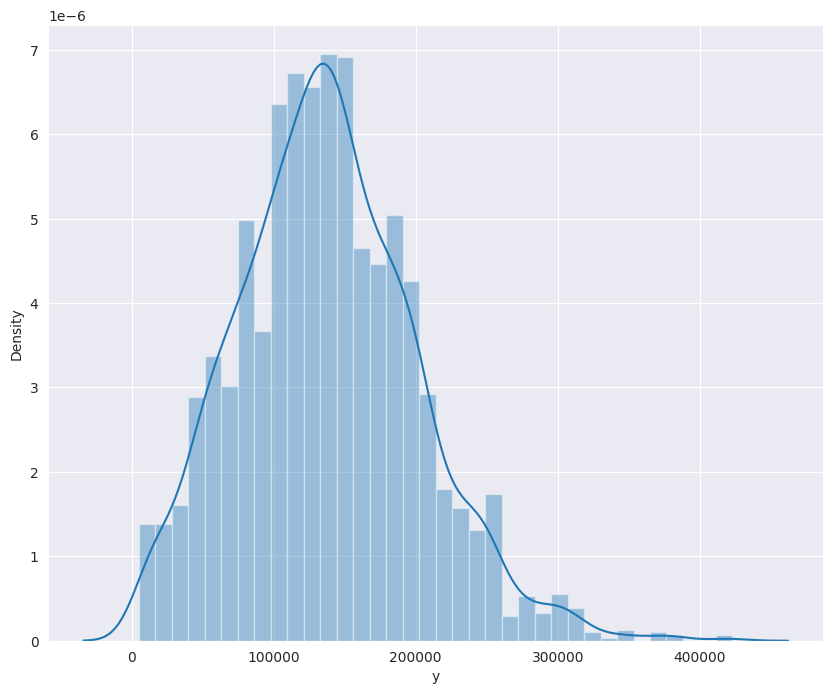

In [124]:
# detecting outlier for "y" columns(label) 
sns.set_style('darkgrid') 
plt.figure(figsize=(10, 8))  
sns.distplot(train['y']) 

##### In the distribution plot above, we see that in "y" label there are some extreme outliers that we can just skip in order to prevent their influence over our Machine Learning and Deep Learning model.  

<AxesSubplot: xlabel='col_4', ylabel='count'>

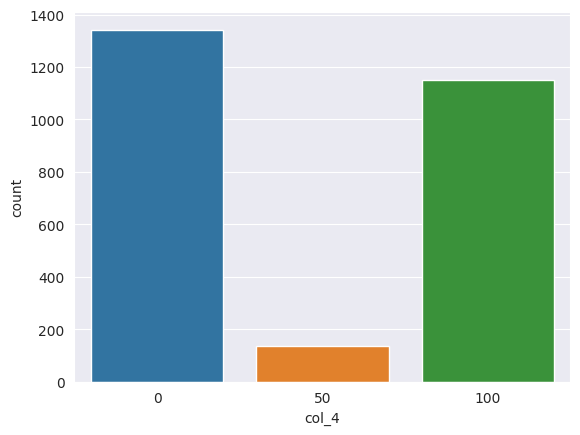

In [125]:
#fig, ax = plt.subplots(2)  
sns.countplot(x=train['col_4'])   

##### in "col_4" there are only three item(0, 50, 100). Number of 0 is most appeared value and 50 most less appeared value. 

In [126]:
# finding correlation 
train.corr()

/tmp/ipykernel_7426/1282447284.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  train.corr()


,col_4,y
col_4,1.000000,-0.047056
y,-0.047056,1.000000


/tmp/ipykernel_7426/2506168336.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(train.corr(), linewidths=0.5, annot=True)


<AxesSubplot: >

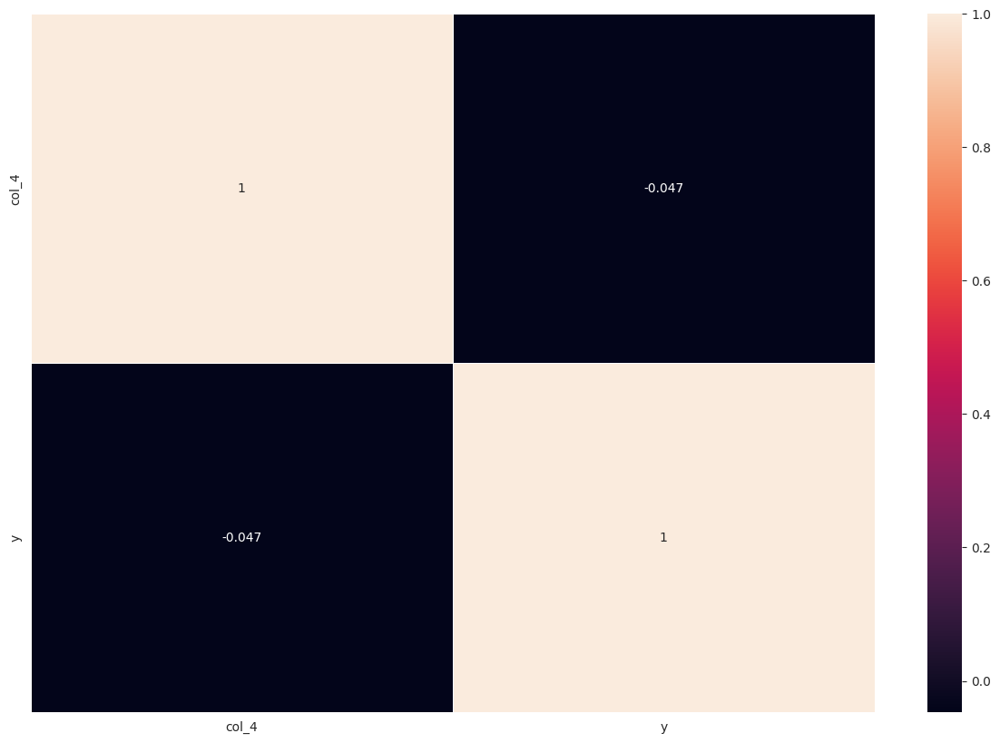

In [127]:
# finding correlation between features, display with heatmap 
plt.figure(figsize=(15,10)) 
sns.heatmap(train.corr(), linewidths=0.5, annot=True) 

In [128]:
# finding most most correlated features with 'y' label 
train.corr()["y"].sort_values(ascending=False)

/tmp/ipykernel_7426/84462470.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  train.corr()["y"].sort_values(ascending=False)


y        1.000000
col_4   -0.047056
Name: y, dtype: float64

<AxesSubplot: xlabel='col_4', ylabel='y'>

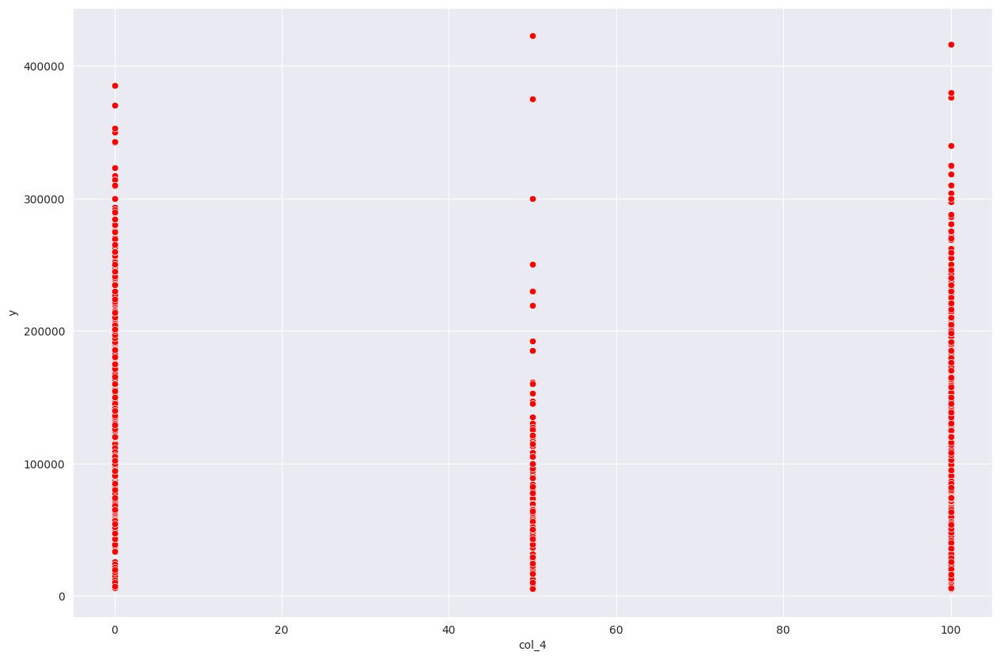

In [129]:
# visualize the relation between "col_4" and "y" 
plt.figure(figsize=(15, 10))
sns.scatterplot(x='col_4', y='y', data=train, color='red')

In [130]:
# describe label column "y" 
train.describe()['y']

count      2628.000000
mean     137642.657154
std       62886.926575
min        5132.000000
25%       95000.000000
50%      135000.000000
75%      176325.000000
max      423000.000000
Name: y, dtype: float64

In [131]:
# Average total of "y" for each unique value of "col_4" 
train.groupby('col_4').mean()['y'] 

/tmp/ipykernel_7426/1718296410.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  train.groupby('col_4').mean()['y']


col_4
0      143418.692480
50      79078.382353
100    137823.271540
Name: y, dtype: float64

/tmp/ipykernel_7426/3386321131.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  train.groupby("col_4").mean()["y"].plot( figsize=(15, 6), c="red")


<AxesSubplot: xlabel='col_4'>

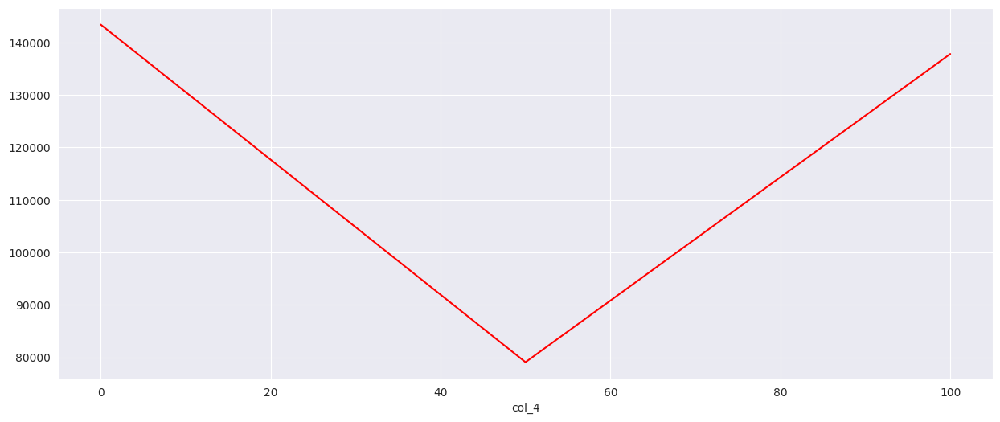

In [132]:
# fig, ax = plt.subplots(1,1)
train.groupby("col_4").mean()["y"].plot( figsize=(15, 6), c="red") 

##### For 0 and 100 "y" values are most. And for 50 "y" value least. 

<AxesSubplot: xlabel='count', ylabel='col_0'>

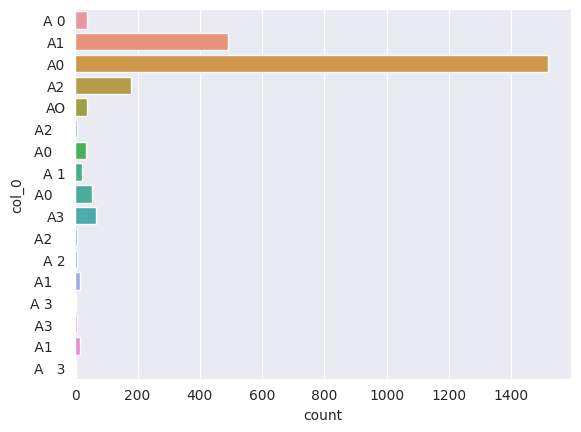

In [133]:
# figure for counting "col_0" values 
sns.countplot(data=train, y='col_0')

<AxesSubplot: xlabel='col_1', ylabel='count'>

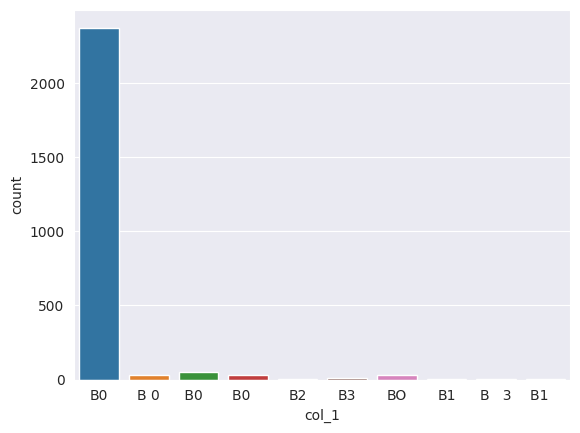

In [134]:
# visualization for counting "col_1" values 
sns.countplot(x=train['col_1']) 

col_0     17
col_1     10
col_2     90
col_3     68
col_4      3
col_5     67
col_6     13
y        836
dtype: int64


Text(0.5, 1.0, 'total unique values in each column(features)')

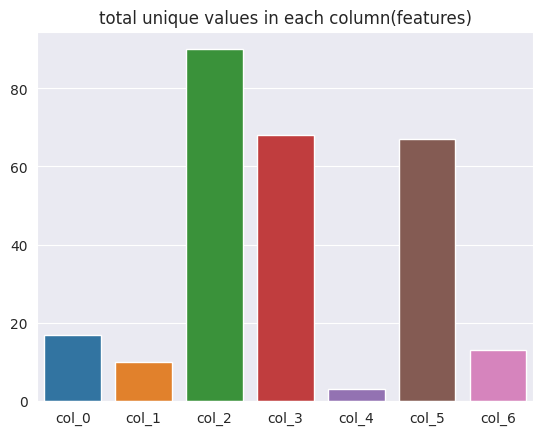

In [135]:
print(train.nunique()) # total unique in each column 
# visualization of total unique values in each column 
train_drop = train.drop(['y'], axis=1) 
sns.barplot(x=train_drop.nunique().index, y=train_drop.nunique().values).set_title("total unique values in each column(features)")


# 5. Detecting Missing values in both train and test dataset 

In [136]:
# checking total null in train dataset 
train.isnull().sum() 

col_0    139
col_1     86
col_2      0
col_3      0
col_4      0
col_5      0
col_6    112
y          0
dtype: int64

In [137]:
# checking total null in test dataset 
test.isnull().sum()

col_0    67
col_1    34
col_2     0
col_3     0
col_4     0
col_5     0
col_6    48
dtype: int64

<AxesSubplot: >

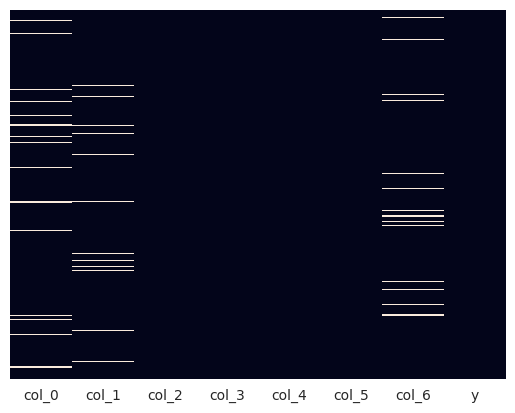

In [138]:
# figure for null value detection in train dataset 
sns.heatmap(train.isnull(), yticklabels=False, cbar=False) 

<AxesSubplot: >

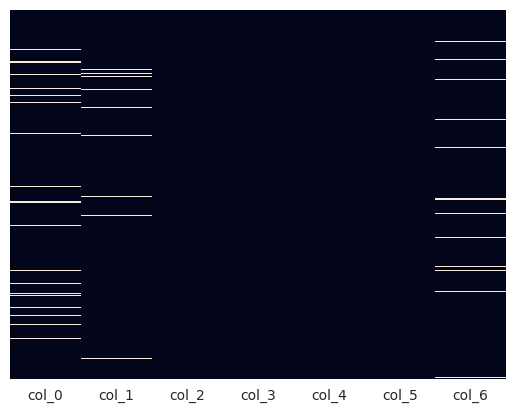

In [139]:
# figure for null value detection in test dataset 
sns.heatmap(test.isnull(), yticklabels=False, cbar=False) 

<AxesSubplot: >

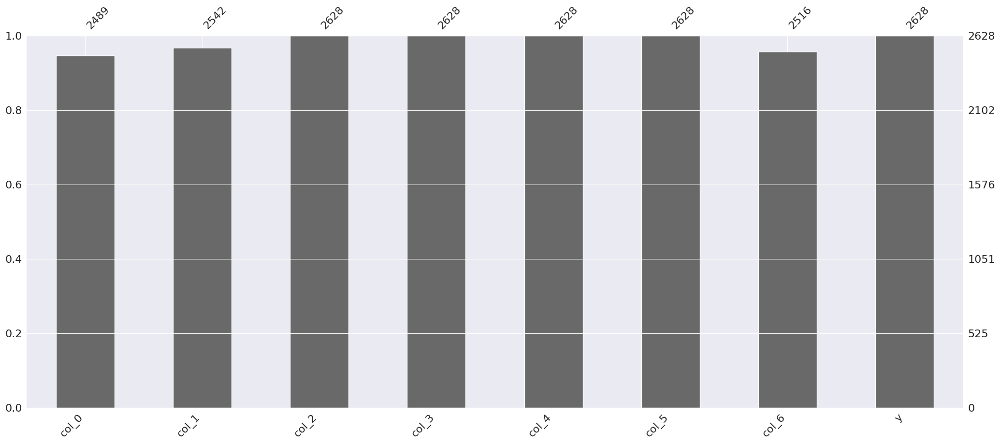

In [140]:
# Detecting missing data visually in train dataset using Missingno library
msno.bar(train)

<AxesSubplot: >

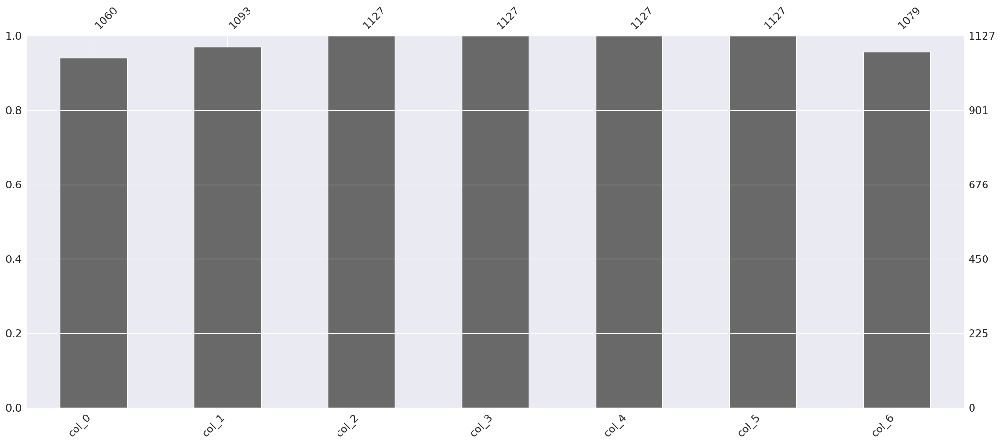

In [141]:
# Detecting missing data visually in test dataset using Missingno library
msno.bar(test)

# 6. Feature Engineering 

### 6.1 Dropping duplicate data

##### 6.1.1 For train dataset

In [142]:
## checking duplicate data
print("Total number of duplicated data in train dataset: ",train.duplicated().sum()) 


# Drop duplicated data in train dataset 
# train.drop_duplicates(inplace=True)
# print("Number of duplicated data after dropping :", train.duplicated().sum()) 

Total number of duplicated data in train dataset:  504


##### 6.1.2 For test dataset

In [143]:
## checking duplicate data
print("Total number of duplicated data in test dataset: ",test.duplicated().sum()) 

# Drop duplicated data in train dataset 
# test.drop_duplicates(inplace=True)
# print("Number of duplicated data after dropping :", test.duplicated().sum()) 

Total number of duplicated data in test dataset:  637


##### I haven't drop the duplicated data becaue dataset is very small.  

### 6.2 working with column "col_0"

##### 6.2.1 working with column "col_0" for train dataset

In [144]:
# Before feature engineering 
print("Before Feature engineering unique value of column 'col_0':\n ", train['col_0'].unique(), "\n\n")

train['col_0'] = train['col_0'].str.replace(' ', '') 
train['col_0'] = train['col_0'].str.replace('AO', 'A0')   
train['col_0'] = train['col_0'].str.replace('A', '') 
print("After Feature engineering unique value of column 'col_0':\n ", train['col_0'].unique())


Before Feature engineering unique value of column 'col_0':
  ['A 0' 'A1' 'A0' 'A2' 'AO' nan ' A2   ' 'A0   ' 'A 1' ' A0   ' 'A3'
 'A2   ' 'A 2' 'A1   ' 'A 3   ' ' A3   ' ' A1   ' 'A   3'] 


After Feature engineering unique value of column 'col_0':
  ['0' '1' '2' nan '3']


##### 6.2.2 working with column "col_0" for test dataset

In [145]:
# Before feature engineering 
print("Before Feature engineering unique value of column 'col_0':\n ", test['col_0'].unique(), "\n\n")

test['col_0'] = test['col_0'].str.replace(' ', '') 
test['col_0'] = test['col_0'].str.replace('AO', 'A0')   
test['col_0'] = test['col_0'].str.replace('A', '') 
print("After Feature engineering unique value of column 'col_0':\n ", test['col_0'].unique())

Before Feature engineering unique value of column 'col_0':
  ['A0' 'A 0' 'A1' nan 'A2' ' A0   ' 'A2   ' 'AO' 'A3' ' A1   ' 'A0   '
 'A1   ' 'A 1' 'A 2' 'A 3   ' ' A2   ' 'A   3'] 


After Feature engineering unique value of column 'col_0':
  ['0' '1' nan '2' '3']


### 6.3 working with column "col_1"

##### 6.3.1 working with column "col_1" for train dataset

In [146]:
# Before feature engineering 
print("Before Feature engineering unique value of column 'col_1':\n ", train['col_1'].unique(), "\n\n")

train['col_1'] = train['col_1'].str.replace(' ', '')
train['col_1'] = train['col_1'].str.replace('BO', 'B0')
train['col_1'] = train['col_1'].str.replace('B', '')
print("After Feature engineering unique value of column 'col_1':\n ", train['col_1'].unique())   

Before Feature engineering unique value of column 'col_1':
  ['B0' 'B 0' ' B0   ' nan 'B0   ' 'B2' 'B3' 'BO' 'B1' 'B   3' 'B1   '] 


After Feature engineering unique value of column 'col_1':
  ['0' nan '2' '3' '1']


##### 6.3.2 working with column "col_0" for test dataset

In [147]:
# Before feature engineering 
print("Before Feature engineering unique value of column 'col_1':\n ", test['col_1'].unique(), "\n\n")

test['col_1'] = test['col_1'].str.replace(' ', '')
test['col_1'] = test['col_1'].str.replace('BO', 'B0')
test['col_1'] = test['col_1'].str.replace('B', '')
print("After Feature engineering unique value of column 'col_1':\n ", test['col_1'].unique())  

Before Feature engineering unique value of column 'col_1':
  ['B0' nan ' B0   ' 'B1' 'BO' 'B0   ' 'B 0' 'B3' 'B2'] 


After Feature engineering unique value of column 'col_1':
  ['0' nan '1' '3' '2']


### 6.4 Working with column "col_2"

##### 6.4.1 working with column "col_2" for train dataset

In [148]:
print("Before Feature engineering unique value of column 'col_2':\n ", train['col_2'].unique(), "\n\n")

train['col_2'] = train['col_2'].str.replace('C', '')
print("After Feature engineering unique value of column 'col_2':\n ", train['col_2'].unique()) 

Before Feature engineering unique value of column 'col_2':
  ['C2' 'C11' 'C18' 'C67' 'C4' 'C52' 'C7' 'C36' 'C57' 'C9' 'C54' 'C41' 'C44'
 'C15' 'C39' 'C40' 'C59' 'C27' 'C29' 'C3' 'C49' 'C33' 'C6' 'C53' 'C12'
 'C1' 'C56' 'C30' 'C81' 'C26' 'C35' 'C22' 'C34' 'C58' 'C21' 'C47' 'C20'
 'C28' 'C50' 'C89' 'C62' 'C92' 'C38' 'C19' 'C0' 'C70' 'C87' 'C69' 'C76'
 'C48' 'C55' 'C85' 'C17' 'C25' 'C16' 'C63' 'C13' 'C46' 'C37' 'C90' 'C86'
 'C31' 'C71' 'C83' 'C45' 'C61' 'C23' 'C88' 'C24' 'C51' 'C72' 'C65' 'C60'
 'C64' 'C82' 'C68' 'C79' 'C5' 'C10' 'C77' 'C42' 'C43' 'C75' 'C8' 'C91'
 'C80' 'C74' 'C14' 'C78' 'C66'] 


After Feature engineering unique value of column 'col_2':
  ['2' '11' '18' '67' '4' '52' '7' '36' '57' '9' '54' '41' '44' '15' '39'
 '40' '59' '27' '29' '3' '49' '33' '6' '53' '12' '1' '56' '30' '81' '26'
 '35' '22' '34' '58' '21' '47' '20' '28' '50' '89' '62' '92' '38' '19' '0'
 '70' '87' '69' '76' '48' '55' '85' '17' '25' '16' '63' '13' '46' '37'
 '90' '86' '31' '71' '83' '45' '61' '23' '88' 

##### 6.4.2 working with column "col_2" for test dataset

In [149]:
print("Before Feature engineering unique value of column 'col_2':\n ", test['col_2'].unique(), "\n\n")

test['col_2'] = test['col_2'].str.replace('C', '') 
print("After Feature engineering unique value of column 'col_2':\n ", test['col_2'].unique()) 

Before Feature engineering unique value of column 'col_2':
  ['C11' 'C26' 'C2' 'C9' 'C28' 'C6' 'C20' 'C15' 'C73' 'C46' 'C21' 'C38' 'C4'
 'C18' 'C72' 'C12' 'C3' 'C42' 'C29' 'C34' 'C30' 'C33' 'C54' 'C19' 'C7'
 'C70' 'C1' 'C50' 'C27' 'C39' 'C78' 'C65' 'C0' 'C45' 'C44' 'C57' 'C84'
 'C66' 'C47' 'C17' 'C56' 'C25' 'C36' 'C49' 'C87' 'C53' 'C69' 'C63' 'C41'
 'C13' 'C5' 'C52' 'C32' 'C59' 'C85' 'C76' 'C35' 'C8'] 


After Feature engineering unique value of column 'col_2':
  ['11' '26' '2' '9' '28' '6' '20' '15' '73' '46' '21' '38' '4' '18' '72'
 '12' '3' '42' '29' '34' '30' '33' '54' '19' '7' '70' '1' '50' '27' '39'
 '78' '65' '0' '45' '44' '57' '84' '66' '47' '17' '56' '25' '36' '49' '87'
 '53' '69' '63' '41' '13' '5' '52' '32' '59' '85' '76' '35' '8']


### 6.5 Working with column "col_3"

##### 6.5.1 working with column "col_3" for train dataset

In [150]:
print("Before Feature engineering unique value of column 'col_3':\n ", train['col_3'].unique(), "\n\n")

train['col_3'] = train['col_3'].str.replace('D', '')
print("After Feature engineering unique value of column 'col_3':\n ", train['col_3'].unique()) 

Before Feature engineering unique value of column 'col_3':
  ['D1' 'D4' 'D0' 'D8' 'D2' 'D41' 'D12' 'D6' 'D53' 'D48' 'D66' 'D26' 'D42'
 'D36' 'D68' 'D54' 'D9' 'D5' 'D55' 'D3' 'D75' 'D21' 'D24' 'D40' 'D16'
 'D39' 'D58' 'D71' 'D32' 'D72' 'D15' 'D13' 'D31' 'D51' 'D76' 'D20' 'D22'
 'D46' 'D10' 'D29' 'D19' 'D56' 'D62' 'D7' 'D23' 'D34' 'D38' 'D77' 'D64'
 'D14' 'D60' 'D37' 'D44' 'D28' 'D45' 'D59' 'D47' 'D11' 'D30' 'D18' 'D27'
 'D49' 'D33' 'D57' 'D35' 'D50' 'D65' 'D73'] 


After Feature engineering unique value of column 'col_3':
  ['1' '4' '0' '8' '2' '41' '12' '6' '53' '48' '66' '26' '42' '36' '68' '54'
 '9' '5' '55' '3' '75' '21' '24' '40' '16' '39' '58' '71' '32' '72' '15'
 '13' '31' '51' '76' '20' '22' '46' '10' '29' '19' '56' '62' '7' '23' '34'
 '38' '77' '64' '14' '60' '37' '44' '28' '45' '59' '47' '11' '30' '18'
 '27' '49' '33' '57' '35' '50' '65' '73']


##### 6.5.2 working with column "col_3" for test dataset

In [151]:
print("Before Feature engineering unique value of column 'col_3':\n ", test['col_3'].unique(), "\n\n")

test['col_3'] = test['col_3'].str.replace('D', '')
print("After Feature engineering unique value of column 'col_3':\n ", test['col_3'].unique())

Before Feature engineering unique value of column 'col_3':
  ['D1' 'D12' 'D3' 'D6' 'D4' 'D67' 'D44' 'D0' 'D46' 'D57' 'D37' 'D39' 'D8'
 'D16' 'D43' 'D69' 'D48' 'D9' 'D13' 'D64' 'D15' 'D55' 'D41' 'D63' 'D33'
 'D2' 'D74' 'D62' 'D52' 'D29' 'D18' 'D17' 'D45' 'D26' 'D10' 'D61' 'D20'
 'D11' 'D19' 'D24' 'D25' 'D5' 'D23' 'D42' 'D22' 'D70'] 


After Feature engineering unique value of column 'col_3':
  ['1' '12' '3' '6' '4' '67' '44' '0' '46' '57' '37' '39' '8' '16' '43' '69'
 '48' '9' '13' '64' '15' '55' '41' '63' '33' '2' '74' '62' '52' '29' '18'
 '17' '45' '26' '10' '61' '20' '11' '19' '24' '25' '5' '23' '42' '22' '70']


### 6.6 Working with column "col_4"

In [152]:
# column "col_4" value printing for train data 
print("Unique values of column col_4 for train dataset: \n",train['col_4'].unique())

Unique values of column col_4 for train dataset: 
 [100   0  50]


In [153]:
# column "col_4" value printing for test data
print("Unique values of column col_4 for test dataset: \n",test['col_4'].unique()) 

Unique values of column col_4 for test dataset: 
 [100   0  50]


### 6.7 Working with column "col_5"

##### 6.7.1 working with column "col_5" for train dataset

In [154]:
print("Before Feature engineering unique value of column 'col_5':\n ", train['col_5'].unique(), "\n\n")
 
train['col_5'] = train['col_5'].str.replace('E', '')
print("After Feature engineering unique value of column 'col_5':\n ", train['col_5'].unique()) 

Before Feature engineering unique value of column 'col_5':
  ['E1' 'E4' 'E0' 'E24' 'E2' 'E19' 'E11' 'E6' 'E52' 'E48' 'E63' 'E36' 'E23'
 'E40' 'E32' 'E38' 'E18' 'E69' 'E8' 'E53' 'E3' 'E70' 'E5' 'E22' 'E45'
 'E14' 'E35' 'E29' 'E67' 'E13' 'E28' 'E51' 'E61' 'E17' 'E20' 'E47' 'E12'
 'E9' 'E49' 'E54' 'E60' 'E7' 'E21' 'E30' 'E34' 'E71' 'E64' 'E59' 'E33'
 'E56' 'E43' 'E27' 'E25' 'E15' 'E58' 'E57' 'E46' 'E10' 'E16' 'E37' 'E26'
 'E50' 'E42' 'E41' 'E44' 'E31' 'E62'] 


After Feature engineering unique value of column 'col_5':
  ['1' '4' '0' '24' '2' '19' '11' '6' '52' '48' '63' '36' '23' '40' '32'
 '38' '18' '69' '8' '53' '3' '70' '5' '22' '45' '14' '35' '29' '67' '13'
 '28' '51' '61' '17' '20' '47' '12' '9' '49' '54' '60' '7' '21' '30' '34'
 '71' '64' '59' '33' '56' '43' '27' '25' '15' '58' '57' '46' '10' '16'
 '37' '26' '50' '42' '41' '44' '31' '62']


##### 6.7.2 working with column "col_5" for test dataset

In [155]:
print("Before Feature engineering unique value of column 'col_5':\n ", test['col_5'].unique(), "\n\n")
 
test['col_5'] = test['col_5'].str.replace('E', '') 
print("After Feature engineering unique value of column 'col_5':\n ", test['col_5'].unique()) 

Before Feature engineering unique value of column 'col_5':
  ['E1' 'E11' 'E3' 'E6' 'E2' 'E51' 'E43' 'E0' 'E44' 'E33' 'E4' 'E35' 'E24'
 'E14' 'E19' 'E39' 'E65' 'E48' 'E8' 'E37' 'E64' 'E13' 'E53' 'E55' 'E22'
 'E68' 'E60' 'E42' 'E16' 'E15' 'E23' 'E9' 'E58' 'E17' 'E10' 'E49' 'E5'
 'E21' 'E38' 'E20' 'E25' 'E66'] 


After Feature engineering unique value of column 'col_5':
  ['1' '11' '3' '6' '2' '51' '43' '0' '44' '33' '4' '35' '24' '14' '19' '39'
 '65' '48' '8' '37' '64' '13' '53' '55' '22' '68' '60' '42' '16' '15' '23'
 '9' '58' '17' '10' '49' '5' '21' '38' '20' '25' '66']


### 6.8 Working with column "col_6"

##### 6.8.1 working with column "col_6" for test dataset

In [156]:
# Before feature engineering 
print("Before Feature engineering unique value of column 'col_6':\n ", train['col_6'].unique(), "\n\n")

train['col_6'] = train['col_6'].str.replace(' ', '') 
train['col_6'] = train['col_6'].str.replace('FO', 'F0')   
train['col_6'] = train['col_6'].str.replace('F', '') 
print("After Feature engineering unique value of column 'col_6':\n ", train['col_6'].unique())

Before Feature engineering unique value of column 'col_6':
  ['F2' 'F0' 'F1' nan 'F2   ' 'F 2' 'F0   ' 'F 0' ' F0   ' 'FO' ' F2   '
 ' F1   ' 'F 1' 'F1   '] 


After Feature engineering unique value of column 'col_6':
  ['2' '0' '1' nan]


##### 6.8.2 working with column "col_6" for test dataset

In [157]:
# Before feature engineering 
print("Before Feature engineering unique value of column 'col_6':\n ", test['col_6'].unique(), "\n\n")

test['col_6'] = test['col_6'].str.replace(' ', '') 
test['col_6'] = test['col_6'].str.replace('FO', 'F0')   
test['col_6'] = test['col_6'].str.replace('F', '') 
print("After Feature engineering unique value of column 'col_6':\n ", test['col_6'].unique())

Before Feature engineering unique value of column 'col_6':
  ['F2' 'F0' nan 'F1' 'F2   ' ' F2   ' 'F 2' 'F 1' ' F0   ' 'F 0'] 


After Feature engineering unique value of column 'col_6':
  ['2' '0' nan '1']


### 6.9 filling nan value with the most frequent value

In [158]:
# Filling nan value for train dataset 
train = train.fillna(train.mode().iloc[0])

# Filling nan value for test dataset 
test = test.fillna(test.mode().iloc[0]) 

### 6.10 Converting each column from object to integer

In [159]:
# Converting train dataset from object to integer 
train = train.astype('int') 

# Converting test dataset from object to integer 
test = test.astype('int') 

# 7. Copy Each dataset for later use

In [160]:
train_copy = train.copy() 
test_copy = test.copy() 
print("Shape of train_copy :", train_copy.shape, "\n", "Shape of test_copy :", test_copy.shape)

Shape of train_copy : (2628, 8) 
 Shape of test_copy : (1127, 7)


# 8. Dividing Dataset

In [161]:
train_array = train.values 
X = train_array[:, 0:7] 
y = train_array[:, 7]

In [162]:
# splitting dataset using train_test_split 
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=.1, random_state=42) 
print("shape of x_train: ", x_train.shape, "\n", "shape of y_train: ", y_train.shape, "\n", "shape of x_test: ", x_test.shape, "\n", "shape of y_test: ", y_test.shape) 

shape of x_train:  (2365, 7) 
 shape of y_train:  (2365,) 
 shape of x_test:  (263, 7) 
 shape of y_test:  (263,)


# 9. Machine Learning Using Random Forest Regressor

In [163]:
from sklearn.metrics import mean_absolute_error 
from sklearn.metrics import explained_variance_score

### 9.1 Define Model

In [164]:
# Define random forest regressor and fit the datasets  
model = RandomForestRegressor(n_estimators=100) 
model.fit(x_train, y_train) 

RandomForestRegressor()

### 9.2 Prediction with Test data

In [165]:
# prediction with the test dataset 
random_forest_prediction = model.predict(x_test)
random_forest_prediction  

array([159695.93753619, 171391.65717958,  90723.36069048, 123478.2952361 ,
       170118.65559233, 170118.65559233, 181463.27684754,  29395.90266667,
       129538.07822448, 168567.85857172, 116680.19899144, 129538.07822448,
       256835.9879634 ,  62979.028     , 126707.11794872, 151812.30173247,
       161416.88744667, 170118.65559233,  90410.11214286, 159695.93753619,
       256835.9879634 , 163406.0521266 , 173804.61637404, 168567.85857172,
       151812.30173247, 151812.30173247, 170118.65559233, 170118.65559233,
       148117.08333333, 181463.27684754, 159695.93753619, 151812.30173247,
       170118.65559233, 130212.27799501, 163406.0521266 , 165243.73015873,
        86448.63994517, 151812.30173247, 212034.29600885,  23208.91      ,
       123478.2952361 , 151812.30173247, 170118.65559233, 177269.74604007,
        52153.37      , 168567.85857172,  96949.88940476, 159695.93753619,
        61933.21669184, 151812.30173247,  41155.0825    ,  63466.01382937,
       168567.85857172, 1

### 9.3 Predicting and Evaluation of the Model's Performance

In [166]:
# finding root mean square error
rmsd = sqrt(mean_squared_error(y_test, random_forest_prediction)) 
print(rmsd) 

47549.349351954144


In [167]:
# find mean absolute error
print("Predictions of knn Regression:", mean_absolute_error(y_test, random_forest_prediction))  

# find variance score
print("The Variance Score :", explained_variance_score(y_test, random_forest_prediction))

Predictions of knn Regression: 36937.439742123875
The Variance Score : 0.4525447650208708


/tmp/ipykernel_7426/278835251.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((y_test - random_forest_prediction), color="red")


<AxesSubplot: ylabel='Density'>

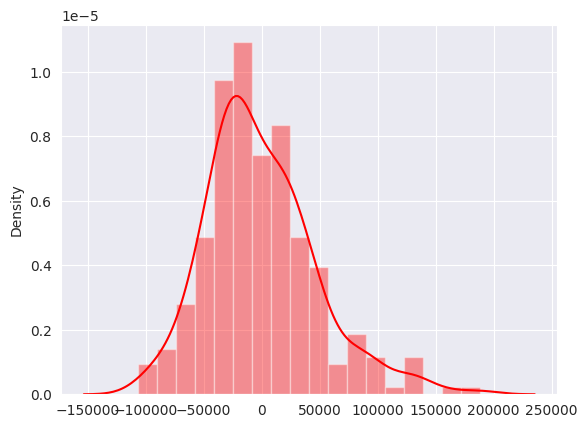

In [168]:
# distplot for (y_test - ridge_model_best_param_prediction) 
sns.distplot((y_test - random_forest_prediction), color="red")  

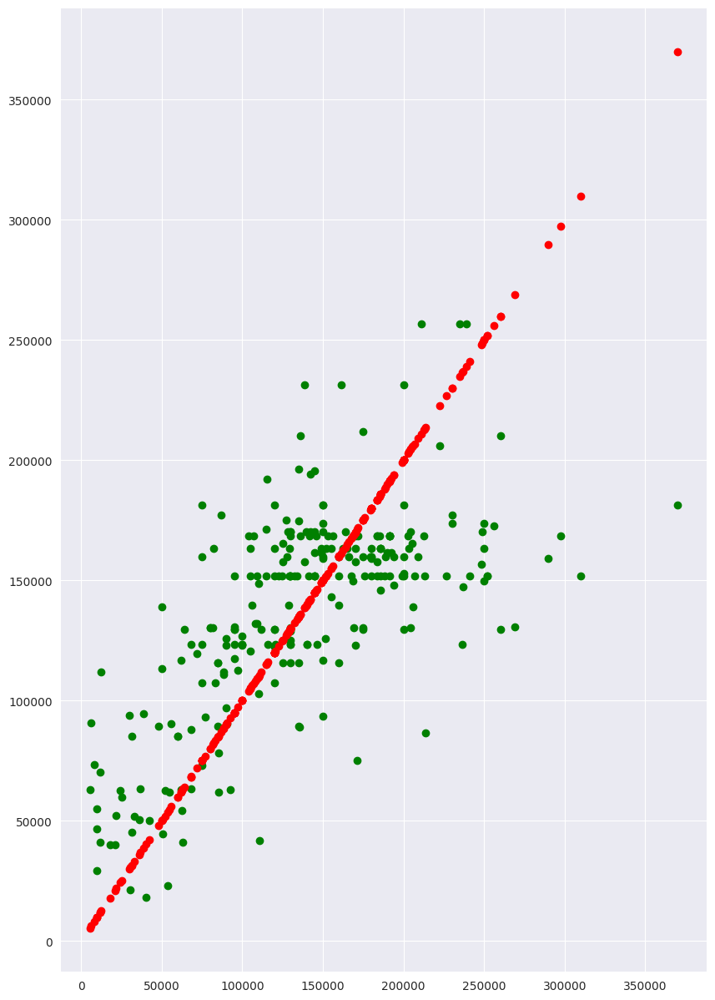

In [169]:
# Graph for checking outlier 
plt.figure(figsize=(10,15))
plt.scatter(y_test, random_forest_prediction, color="green")  
plt.scatter(y_test, y_test, color="red") 

### 9.4 Prediction with actual test data

In [170]:
# predict with actual test data
random_forest_test_prediction = model.predict(test_copy)  
random_forest_test_prediction

/home/moni/.local/lib/python3.10/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


array([159695.93753619, 151812.30173247, 159695.93753619, ...,
        68187.22847819, 168567.85857172, 151812.30173247])

### 9.5 cross_val_score in train data

In [171]:
# printing cross validation score 
cvs = cross_val_score(model, x_train,y_train, cv=5)
print("Cross Validation Score is: ", cvs) 
print("Mean of the cross validation score: ", cvs.mean()) 

Cross Validation Score is:  [0.36213343 0.3915854  0.39239229 0.4004968  0.34924953]
Mean of the cross validation score:  0.37917149122807714


### 9.6 Saving predicted data

In [172]:
# preparing submission file
def prepare_submission_file(sample_submission):
    submission_file = pd.read_csv(sample_submission)
    
    UID_array = np.array(submission_file['UID']) 
    submission_df = pd.DataFrame({'UID': UID_array, 'y': random_forest_test_prediction}) 
    return submission_df 

In [173]:
# calling the prepare_submission_file function 
submission_file = prepare_submission_file("/home/moni/Senior ML Competition/sample_submission.csv") 
submission_file.to_csv("/home/moni/Senior ML Competition/random_forest_predicted_result_file.csv", index=False)  
submission_file.head() 

,UID,y
0,2628,159695.937536
1,2629,151812.301732
2,2630,159695.937536
3,2631,178080.822779
4,2632,159695.937536


# 10. Hyperparameter Tuning with XGBoost

In [180]:
# define model 
regressor=xgboost.XGBRegressor()

# hyperparameter grid 
hyperparameter_grid = {
    'n_estimators': [100, 500, 900, 1100, 1500],
    'max_depth':[2, 3, 5, 10, 15],
    'learning_rate':[0.05,0.1,0.15,0.20],
    'min_child_weight':[1,2,3,4],
    'booster':['gbtree','gblinear'],
    'base_score':[0.25,0.5,0.75,1]
    }

# define randomizedsearchCV
random_cv = RandomizedSearchCV(estimator=regressor,
            param_distributions=hyperparameter_grid,
            cv=5, 
            n_iter=50,
            scoring = 'neg_mean_absolute_error',
            n_jobs = 4,
            verbose = 5, 
            return_train_score = True,
            random_state=42)

In [181]:
# fit the data in random_cv 
random_cv.fit(X, y) 

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[19:46:17] WARNING: ../src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[19:46:17] WARNING: ../src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[19:46:17] WARNING: ../src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[19:46:17] WARNING: ../src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[CV 3/5] END base_score=0.75, booster=gblinear, learning_rate=0.2, max_depth=15, min_child_weight=1, n_estimators=1500;, score=(train=-45272.898, test=-44903.682) total time=   0.2s
[19:46:17] WARNING: ../src/learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[CV 1/5] END base_score=0.75, booster=gblinear, learning_rate=0.2, max_depth=15, min_child_weight=1, n_estimators=1500;, score=(train=-45436.969, test=-44498.322) total time=   0.2s
[CV 2/5] END base_score=0.75, booster=g

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          predictor=None, random_state=None, ...),
                   n_iter=50, n_jobs=4,
                   param_distributions={'base_score': [0.25, 0.5, 0.75, 1],
                                        'booster': ['gbtree', 'gblinear'],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2],
                                        'max_depth': [2, 3, 5, 10, 15],
                                        'min_child_weight': [1, 2, 3, 4],
                                        'n_estimators': [100, 500, 900, 1100,
                                                         1500]},
                   random_state=42, return_train_score=True,
                   scoring='neg_mean_absolute_error', verbose=5)

In [182]:
# finding best parameters 
random_cv.best_estimator_ 

XGBRegressor(base_score=1, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.15, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=2, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [183]:
# defining algorithms with best parameters 
regressor=xgboost.XGBRegressor(base_score=1, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.15, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=2, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None)

In [184]:
# fit the data to the best parameters model 
regressor.fit(X, y) 

XGBRegressor(base_score=1, booster='gbtree', callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.15, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=2, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

### 10.1 predict with actual test data

In [185]:
# predicting test data 
xgboost_prediction = regressor.predict(test_copy) 
xgboost_prediction 

array([158314.02 , 154993.08 , 158314.02 , ...,  75813.914, 165635.16 ,
       154993.08 ], dtype=float32)

### 10.2 preparing submission file

In [186]:
# preparing submission file
def prepare_submission_file(sample_submission):
    submission_file = pd.read_csv(sample_submission)
    UID_array = np.array(submission_file['UID'])
    submission_df = pd.DataFrame({'UID': UID_array, 'y': xgboost_prediction}) 
    return submission_df 

In [187]:
# calling the prepare_submission_file function 
submission_file = prepare_submission_file("/home/moni/Senior ML Competition/sample_submission.csv")
submission_file.to_csv("/home/moni/Senior ML Competition/xgboost_predicted_result_file.csv", index=False)  
submission_file.head() 

,UID,y
0,2628,158314.015625
1,2629,154993.078125
2,2630,158314.015625
3,2631,204813.000000
4,2632,158314.015625


### 10.3 Using cross validation score

In [188]:
#cross_val_score in train data
cvs = cross_val_score(regressor, X, y, cv=5) 
print("Cross Validation Score", cvs) 
print("Mean cross validation score: ", cvs.mean()) 

Cross Validation Score [0.4466663  0.37182705 0.44142405 0.39562038 0.41289948]
Mean cross validation score:  0.4136874505412275


# 10. Using Deep Learning 

In [189]:
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import mean_absolute_error, mean_squared_error, explained_variance_score
from sklearn.preprocessing import StandardScaler

import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras import layers
from tensorflow.keras import Sequential 
from tensorflow.keras.layers import Dense

print(tf.__version__)

2.9.1


### 10.1 Dividing dataset

In [190]:
# dividing train_copy data into X, y
X = train_copy.drop("y", axis=1).values  
y = train_copy['y'].values   

In [191]:
# dividing X, y data into train, valid 
x_train, x_valid, y_train, y_valid = train_test_split(X, y, test_size=.1) 
print("shape of x_train: ", x_train.shape, "\n", "shape of y_train: ", y_train.shape, "\n", "shape of x_valid: ", x_valid.shape, "\n", "shape of y_valid: ", y_valid.shape) 

shape of x_train:  (2365, 7) 
 shape of y_train:  (2365,) 
 shape of x_valid:  (263, 7) 
 shape of y_valid:  (263,)


### 10.2 Building Model 

In [192]:
model=Sequential() 
model.add(Dense(19, activation="relu")) 
model.add(Dense(19, activation="relu")) 
model.add(Dense(19, activation="relu")) 
model.add(Dense(19, activation="relu")) 
model.add(Dense(1)) 

2023-07-17 19:48:19.214599: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-07-17 19:48:19.225896: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (moni-asus-tuf-gaming-f15): /proc/driver/nvidia/version does not exist
2023-07-17 19:48:19.235555: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [193]:
# Compile Model 
model.compile(optimizer="adam", loss="mse") 

### 10.3 Training the Model

In [194]:
# Training the model 
model.fit(x= x_train, y= y_train, batch_size=128, epochs=500, validation_data=(x_valid, y_valid))

Epoch 1/500
19/19 [==============================] - 1s 6ms/step - loss: 22766635008.0000 - val_loss: 24084867072.0000
Epoch 2/500
19/19 [==============================] - 0s 2ms/step - loss: 22765189120.0000 - val_loss: 24082982912.0000
Epoch 3/500
19/19 [==============================] - 0s 2ms/step - loss: 22762328064.0000 - val_loss: 24078497792.0000
Epoch 4/500
19/19 [==============================] - 0s 2ms/step - loss: 22754695168.0000 - val_loss: 24065957888.0000
Epoch 5/500
19/19 [==============================] - 0s 2ms/step - loss: 22732158976.0000 - val_loss: 24028637184.0000
Epoch 6/500
19/19 [==============================] - 0s 2ms/step - loss: 22670432256.0000 - val_loss: 23934959616.0000
Epoch 7/500
19/19 [==============================] - 0s 2ms/step - loss: 22525597696.0000 - val_loss: 23721041920.0000
Epoch 8/500
19/19 [==============================] - 0s 2ms/step - loss: 22205370368.0000 - val_loss: 23283146752.0000
Epoch 9/500
19/19 [=============================

### 10.4 Predicting and Evaluation of the Model's Performance

In [195]:
# loss and validation loss during training 
pd.DataFrame(model.history.history) 

,loss,val_loss
0,2.276664e+10,2.408487e+10
1,2.276519e+10,2.408298e+10
2,2.276233e+10,2.407850e+10
3,2.275470e+10,2.406596e+10
4,2.273216e+10,2.402864e+10
...,...,...
495,2.910676e+09,3.017345e+09
496,2.903279e+09,3.019850e+09
497,2.925901e+09,3.005605e+09
498,2.899110e+09,3.034624e+09


<AxesSubplot: >

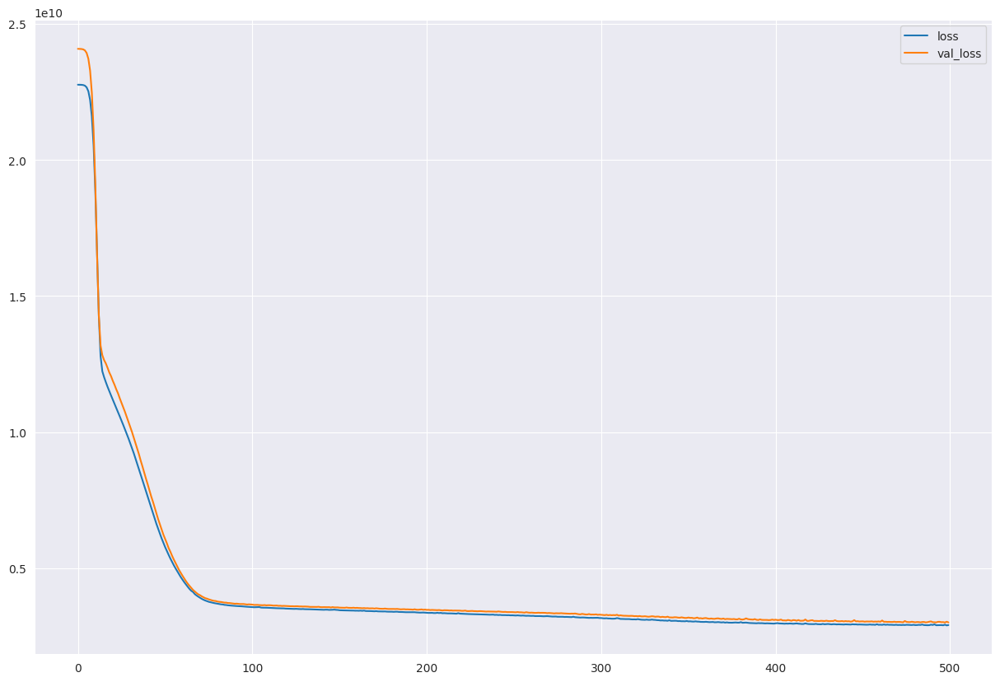

In [196]:
# plotting the loss and validation loss
pd.DataFrame(model.history.history).plot(figsize=(15,10))

In [197]:
# prediction with the test data 
predictions=model.predict(x_valid) 
len(predictions) 

9/9 [==============================] - 0s 711us/step


263

In [198]:
# finding mae, mse, 
print("The absolute mean error :",mean_absolute_error(y_valid, predictions))
print("The squared mean error :",mean_squared_error(y_valid, predictions)) 
print("The squared mean error :",np.sqrt(mean_squared_error(y_valid, predictions)))

The absolute mean error : 40981.465333887834
The squared mean error : 3009289306.6425166
The squared mean error : 54856.98958785942


In [199]:
# mean of "train_copy['y']" and mean absolute error 
print("The mean of the real data: ",train_copy["y"].mean())
print("The absolute mean error :",mean_absolute_error(y_valid, predictions))

The mean of the real data:  137642.65715372906
The absolute mean error : 40981.465333887834


In [200]:
# explained variance score 
print("The Variance Score :", explained_variance_score(y_valid, predictions)) 

The Variance Score : 0.20190894585398889


/tmp/ipykernel_7426/3793890219.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((y_valid-predictions), color="red")


<AxesSubplot: ylabel='Density'>

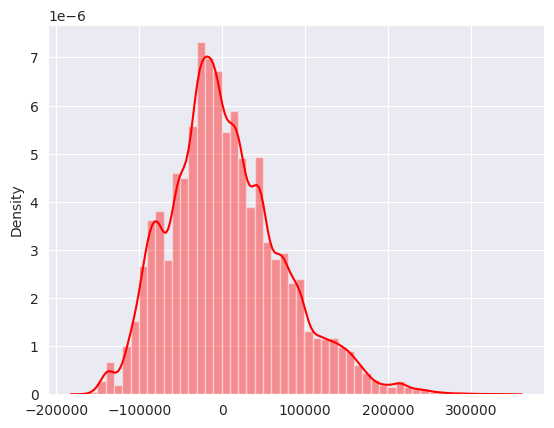

In [201]:
# displot of (y_valid - predictions) 
sns.distplot((y_valid-predictions), color="red")

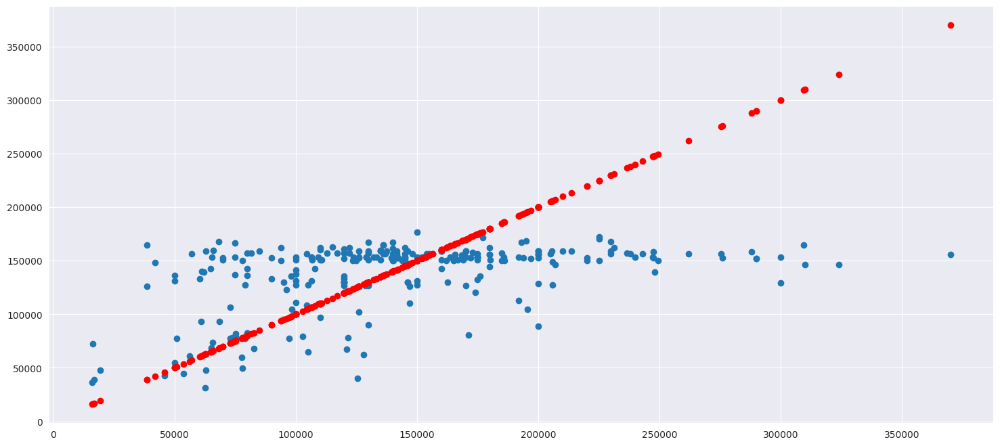

In [202]:
plt.figure(figsize=(18,8))
plt.scatter(y_valid, predictions)
plt.scatter(y_valid, y_valid, color="red")

##### Because the predictions of our model is not good enough, we will standardize our features and retrain the model

### 10.5 Prediction with actual test data

In [204]:
# predicting test data 
nn1_prediction = model.predict(test_copy) 
nn1_prediction 

36/36 [==============================] - 0s 469us/step


array([[158739.45],
       [153565.47],
       [158739.45],
       ...,
       [137756.52],
       [156530.98],
       [153565.47]], dtype=float32)

### 10.6 preparing submission file

In [212]:
# preparing submission file
def prepare_submission_file(sample_submission): 
    submission_file = pd.read_csv(sample_submission)
    UID_array = np.array(submission_file['UID'])
    submission_df = pd.DataFrame({'UID': UID_array, 'y': nn1_prediction.flatten()}) 
    return submission_df 

In [213]:
# calling the prepare_submission_file function 
submission_file = prepare_submission_file("/home/moni/Senior ML Competition/sample_submission.csv")
submission_file.to_csv("/home/moni/Senior ML Competition/nn1_predicted_result_file.csv", index=False)  
submission_file.head() 

,UID,y
0,2628,158739.453125
1,2629,153565.468750
2,2630,158739.453125
3,2631,173129.781250
4,2632,158739.453125


# 11. Retraining Our Model with Standardize

In [214]:
# Define StandardScaler 
scaler=StandardScaler()
scaler.fit(x_train) 

StandardScaler()

### 11.1 Building Model 

In [215]:
# Building Neural Network Model
model2=Sequential() 
model2.add(Dense(19, activation="relu")) 
model2.add(Dense(19, activation="relu")) 
model2.add(Dense(19, activation="relu")) 
model2.add(Dense(19, activation="relu")) 
model2.add(Dense(1)) 

In [216]:
# compile model 
model2.compile(optimizer="adam", loss="mse")

### 11.2 Training the Model 

In [217]:
model2.fit(x= x_train, y= y_train, batch_size=64, epochs=500, validation_data=(x_valid, y_valid))

Epoch 1/500


37/37 [==============================] - 0s 3ms/step - loss: 22764146688.0000 - val_loss: 24080488448.0000
Epoch 2/500
37/37 [==============================] - 0s 2ms/step - loss: 22755072000.0000 - val_loss: 24063956992.0000
Epoch 3/500
37/37 [==============================] - 0s 1ms/step - loss: 22715899904.0000 - val_loss: 23988232192.0000
Epoch 4/500
37/37 [==============================] - 0s 1ms/step - loss: 22543183872.0000 - val_loss: 23666679808.0000
Epoch 5/500
37/37 [==============================] - 0s 1ms/step - loss: 21887967232.0000 - val_loss: 22574114816.0000
Epoch 6/500
37/37 [==============================] - 0s 1ms/step - loss: 20062298112.0000 - val_loss: 19870076928.0000
Epoch 7/500
37/37 [==============================] - 0s 1ms/step - loss: 16577311744.0000 - val_loss: 15691707392.0000
Epoch 8/500
37/37 [==============================] - 0s 1ms/step - loss: 13386476544.0000 - val_loss: 13351880704.0000
Epoch 9/500
37/37 [==============================] - 0s 1ms/

### 11.3 Predicting and Evaluation of the Model's Performance

In [218]:
# printing loss and validation loss during training 
pd.DataFrame(model2.history.history)

,loss,val_loss
0,2.276415e+10,2.408049e+10
1,2.275507e+10,2.406396e+10
2,2.271590e+10,2.398823e+10
3,2.254318e+10,2.366668e+10
4,2.188797e+10,2.257411e+10
...,...,...
495,2.816710e+09,2.899936e+09
496,2.823373e+09,2.874272e+09
497,2.807015e+09,2.947258e+09
498,2.812646e+09,2.870394e+09


<AxesSubplot: >

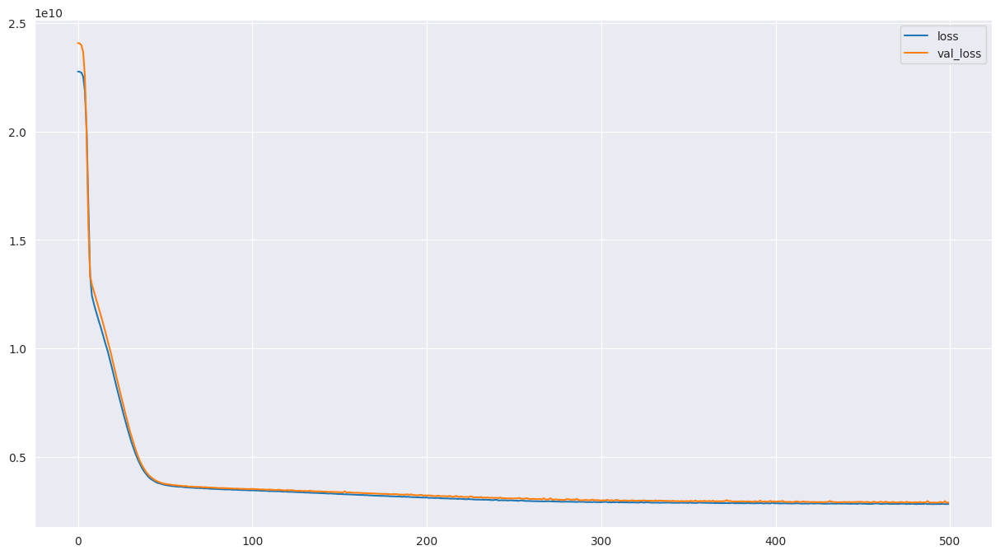

In [219]:
# Figure of loss and validation loss 
pd.DataFrame(model2.history.history).plot(figsize=(15,8))

In [220]:
# prediction with validation data 
predictions2=model2.predict(x_valid)
predictions2

9/9 [==============================] - 0s 865us/step


array([[154787.7  ],
       [153301.47 ],
       [153697.38 ],
       [162201.66 ],
       [158372.39 ],
       [154787.7  ],
       [153707.12 ],
       [147207.55 ],
       [ 36899.35 ],
       [155602.4  ],
       [130606.65 ],
       [147207.55 ],
       [150456.53 ],
       [ 65331.438],
       [153697.38 ],
       [123049.07 ],
       [154787.7  ],
       [153123.98 ],
       [154217.39 ],
       [153697.38 ],
       [173991.38 ],
       [154787.7  ],
       [162201.66 ],
       [145041.16 ],
       [154217.39 ],
       [153301.47 ],
       [145041.16 ],
       [154787.7  ],
       [153123.98 ],
       [152622.11 ],
       [147207.55 ],
       [153123.98 ],
       [125208.375],
       [154787.7  ],
       [154787.7  ],
       [153301.47 ],
       [173991.38 ],
       [154787.7  ],
       [154787.7  ],
       [152644.19 ],
       [ 84866.81 ],
       [ 46176.7  ],
       [132143.34 ],
       [117775.67 ],
       [132143.34 ],
       [117287.36 ],
       [153415.55 ],
       [13214

In [221]:
print("The absolute mean error :",mean_absolute_error(y_valid, predictions2))
print("The squared mean error :",mean_squared_error(y_valid, predictions2))
print("The squared mean error :",np.sqrt(mean_squared_error(y_valid, predictions2)))

The absolute mean error : 40185.64972968156
The squared mean error : 2885573420.389965
The squared mean error : 53717.53364023673


In [222]:
print("The mean of the real data: ",train_copy["y"].mean())
print("The absolute mean error :",mean_absolute_error(y_valid, predictions2))

The mean of the real data:  137642.65715372906
The absolute mean error : 40185.64972968156


In [223]:
# printing explained variance score 
print("The Variance Score :", explained_variance_score(y_valid, predictions2)) 

The Variance Score : 0.2422605151399324


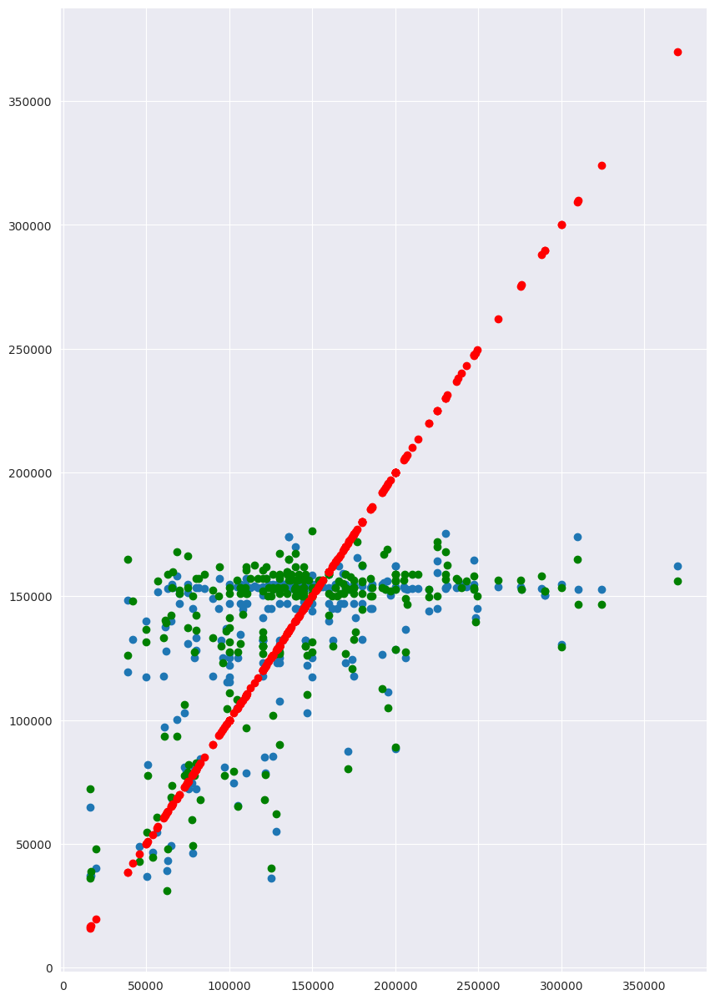

In [224]:
# checking outlier of predicted data 
plt.figure(figsize=(10,15))
plt.scatter(y_valid,predictions2)
plt.scatter(y_valid,predictions, color="green") 
plt.scatter(y_valid,y_valid, color="red")

##### It is clear that in above figure lots of outlier. We need more better model

### 11.4 Prediction with Actual Test data

In [225]:
# predicting test data 
nn2_prediction = model2.predict(test_copy) 
nn2_prediction 

36/36 [==============================] - 0s 466us/step


array([[153123.98 ],
       [154787.7  ],
       [153123.98 ],
       ...,
       [130836.625],
       [153697.38 ],
       [154787.7  ]], dtype=float32)

### 11.5 preparing submission file

In [228]:
# preparing submission file
def prepare_submission_file(sample_submission): 
    submission_file = pd.read_csv(sample_submission)
    UID_array = np.array(submission_file['UID'])
    submission_df = pd.DataFrame({'UID': UID_array, 'y': nn2_prediction.flatten()}) 
    return submission_df 

In [229]:
# calling the prepare_submission_file function
submission_file = prepare_submission_file("/home/moni/Senior ML Competition/sample_submission.csv")
submission_file.to_csv("/home/moni/Senior ML Competition/nn2_predicted_result_file.csv", index=False)  
submission_file.head() 

,UID,y
0,2628,153123.984375
1,2629,154787.703125
2,2630,153123.984375
3,2631,166050.406250
4,2632,153123.984375


# 12 Another Deep Learning Model For Better Accuracy

### 12.1 Define the Model

In [230]:
model3=Sequential() 
model3.add(Dense(19, activation="relu")) 
model3.add(Dense(19, activation="relu")) 
model3.add(Dense(19, activation="relu"))
model3.add(Dense(19, activation="relu")) 
model3.add(Dense(1)) 

In [231]:
# Compile the model 
model3.compile(optimizer="rmsprop",loss="mse") 

### 12.2 Training The Model 

In [233]:
# training the model 
model3.fit(x= x_train, y= y_train, batch_size=64, epochs=500, validation_data=(x_valid, y_valid)) 

Epoch 1/500
37/37 [==============================] - 0s 1ms/step - loss: 3470183168.0000 - val_loss: 3564717568.0000
Epoch 2/500
 1/37 [..............................] - ETA: 0s - loss: 2929613312.0000

37/37 [==============================] - 0s 1ms/step - loss: 3471909120.0000 - val_loss: 3552505344.0000
Epoch 3/500
37/37 [==============================] - 0s 1ms/step - loss: 3468311040.0000 - val_loss: 3554835712.0000
Epoch 4/500
37/37 [==============================] - 0s 1ms/step - loss: 3462038528.0000 - val_loss: 3555027712.0000
Epoch 5/500
37/37 [==============================] - 0s 1ms/step - loss: 3461213696.0000 - val_loss: 3546291456.0000
Epoch 6/500
37/37 [==============================] - 0s 1ms/step - loss: 3458004480.0000 - val_loss: 3542788608.0000
Epoch 7/500
37/37 [==============================] - 0s 1ms/step - loss: 3454562304.0000 - val_loss: 3540835584.0000
Epoch 8/500
37/37 [==============================] - 0s 1ms/step - loss: 3452997376.0000 - val_loss: 3552634112.0000
Epoch 9/500
37/37 [==============================] - 0s 1ms/step - loss: 3452589312.0000 - val_loss: 3536553472.0000
Epoch 10/500
37/37 [==============================] - 0s 1ms/step - loss: 34

### 12.3 Predicting and Evaluation of the Model's Performance

In [234]:
predictions3 = model3.predict(x_valid) 
predictions3 

9/9 [==============================] - 0s 630us/step


array([[154110.7  ],
       [153560.14 ],
       [153439.58 ],
       [159396.67 ],
       [167764.1  ],
       [154110.7  ],
       [156715.67 ],
       [148824.7  ],
       [ 44994.387],
       [161204.08 ],
       [128383.336],
       [148824.7  ],
       [151090.14 ],
       [ 54895.566],
       [153439.58 ],
       [121496.95 ],
       [154110.7  ],
       [154960.52 ],
       [157924.08 ],
       [153439.58 ],
       [170169.83 ],
       [154110.7  ],
       [159396.67 ],
       [147314.42 ],
       [157924.08 ],
       [153560.14 ],
       [147314.42 ],
       [154110.7  ],
       [154960.52 ],
       [152600.42 ],
       [148824.7  ],
       [154960.52 ],
       [123086.54 ],
       [154110.7  ],
       [154110.7  ],
       [153560.14 ],
       [170169.83 ],
       [154110.7  ],
       [154110.7  ],
       [155129.67 ],
       [ 70300.37 ],
       [ 47316.152],
       [130502.05 ],
       [127768.93 ],
       [130502.05 ],
       [126544.32 ],
       [156025.11 ],
       [13050

In [235]:
# print mae, mse 
print("The absolute mean error :",mean_absolute_error(y_valid, predictions3))
print("The squared mean error :",mean_squared_error(y_valid, predictions3)) 
print("The squared mean error :",np.sqrt(mean_squared_error(y_valid, predictions3)))

The absolute mean error : 40329.14190975523
The squared mean error : 2937201110.7794294
The squared mean error : 54195.95105521657


In [236]:
print("The mean of the real data: ",train_copy["y"].mean()) 
print("The absolute mean error :", mean_absolute_error(y_valid, predictions3)) 

The mean of the real data:  137642.65715372906
The absolute mean error : 40329.14190975523


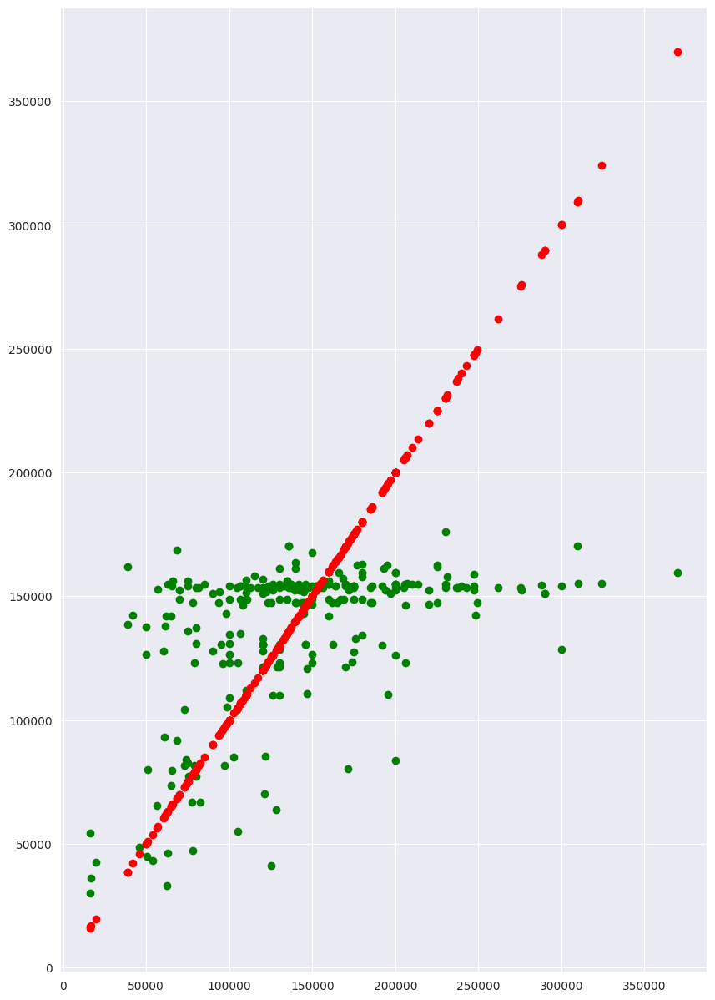

In [237]:
plt.figure(figsize=(10,15))
plt.scatter(y_valid, predictions3, color="green")
plt.scatter(y_valid, y_valid, color="red") 

### 12.4 Prediction with Actual Test data

In [238]:
# predicting test data 
nn3_prediction = model3.predict(test_copy) 
nn3_prediction 

36/36 [==============================] - 0s 487us/step


array([[154960.52],
       [154110.7 ],
       [154960.52],
       ...,
       [133426.53],
       [153439.58],
       [154110.7 ]], dtype=float32)

### 12.5 preparing submission file

In [241]:
# preparing submission file
def prepare_submission_file(sample_submission): 
    submission_file = pd.read_csv(sample_submission)
    UID_array = np.array(submission_file['UID'])
    submission_df = pd.DataFrame({'UID': UID_array, 'y': nn3_prediction.flatten()})  
    return submission_df 

In [242]:
# calling the prepare_submission_file function
submission_file = prepare_submission_file("/home/moni/Senior ML Competition/sample_submission.csv")
submission_file.to_csv("/home/moni/Senior ML Competition/nn3_predicted_result_file.csv", index=False)  
submission_file.head() 

,UID,y
0,2628,154960.515625
1,2629,154110.703125
2,2630,154960.515625
3,2631,163460.640625
4,2632,154960.515625


# 13. Using Linear Regression

In [243]:
from sklearn.linear_model import LinearRegression 

### 13.1 Dividing Dataset

In [244]:
# dividing dataset 
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=.1) 

### 13.2 Define Algorithms

In [245]:
# Defining LinearRegression model 
linear_model = LinearRegression() 
linear_model.fit(x_train, y_train) 

LinearRegression()

### 13.3 Prediction with test data

In [246]:
# predicting with test data 
linear_prediction = linear_model.predict(x_test) 
linear_prediction

array([148398.49966658, 148307.74086424, 149681.00018565, 124288.75911549,
       149499.48258096, 148307.74086424, 148716.1554748 , 149590.24138331,
       149907.89719152, 137749.41199601, 149590.24138331, 151441.45149831,
       148307.74086424, 137431.75618779, 148625.39667245, 123990.7704732 ,
       149817.13838918, 110560.68554512, 101538.38318447,  48969.07963674,
       150225.55299974, 149079.19068419, 149907.89719152, 149499.48258096,
       148716.1554748 , 149590.24138331, 113024.02699441, 136557.67027928,
       138100.56991919, 148307.74086424, 137749.41199601,  50797.51864162,
       148716.1554748 , 143673.5758289 , 148262.36146306, 135663.91720485,
       131832.7464416 , 148716.1554748 , 137749.41199601, 148398.49966658,
       112240.69988825, 148307.74086424, 130988.33058299, 148307.74086424,
       138793.138223  , 148398.49966658, 149499.48258096, 148307.74086424,
       148353.12026541, 149590.24138331, 148307.74086424, 137431.75618779,
       114325.07516973, 1

### 13.4 Predicting and Evaluation of the Model's Performance

In [247]:
# find mean absolute error 
print("Predictions of Linear Regression:", mean_absolute_error(y_test, linear_prediction)) 

# find variance score
print("The Variance Score :", explained_variance_score(y_test, linear_prediction))

Predictions of Linear Regression: 42175.74600613308
The Variance Score : 0.18705443592468474


/tmp/ipykernel_7426/3402130129.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((y_test - linear_prediction), color="red")


<AxesSubplot: ylabel='Density'>

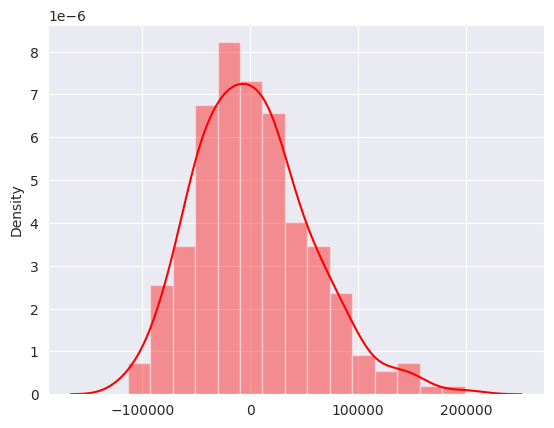

In [248]:
# distplot for (y_test - linear_prediction) 
sns.distplot((y_test - linear_prediction), color="red")  

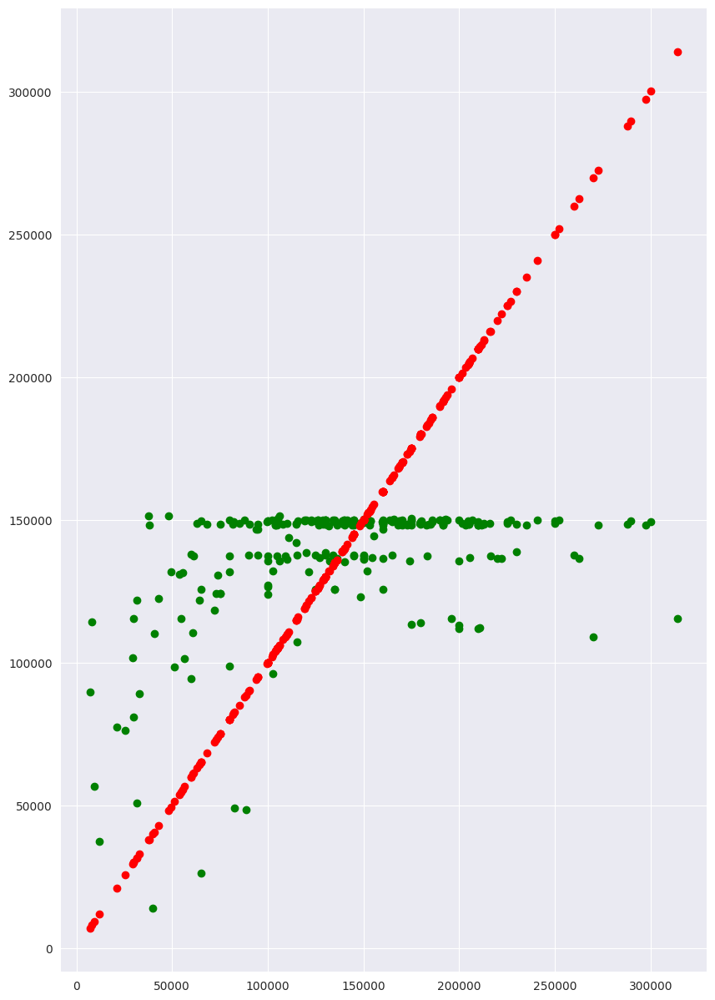

In [249]:
# Graph for checking outlier 
plt.figure(figsize=(10,15)) 
plt.scatter(y_test, linear_prediction, color="green") 
plt.scatter(y_test, y_test, color="red") 

### 13.5 Prediction with actual data

In [250]:
# predict with actual test data
linear_model_prediction = linear_model.predict(test_copy)  
linear_model_prediction 

/home/moni/.local/lib/python3.10/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(


array([148716.1554748 , 149907.89719152, 148716.1554748 , ...,
       125273.27099227, 148307.74086424, 149907.89719152])

### 13.6 preparing submission file

In [251]:
# preparing submission file
def prepare_submission_file(sample_submission): 
    submission_file = pd.read_csv(sample_submission)
    UID_array = np.array(submission_file['UID'])
    submission_df = pd.DataFrame({'UID': UID_array, 'y': linear_model_prediction})  
    return submission_df 

In [252]:
# calling the prepare_submission_file function
submission_file = prepare_submission_file("/home/moni/Senior ML Competition/sample_submission.csv")
submission_file.to_csv("/home/moni/Senior ML Competition/linear_regression_predicted_result_file.csv", index=False)  
submission_file.head() 

,UID,y
0,2628,148716.155475
1,2629,149907.897192
2,2630,148716.155475
3,2631,136344.608222
4,2632,148716.155475


# 14. Using Ridge Model with Hyperparameter Optimization

In [253]:
from scipy.stats import loguniform
from sklearn.linear_model import Ridge 
from sklearn.model_selection import RepeatedKFold

### 14.1 Dividing Dataset

In [254]:
# Dividing dataset 
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=.1)  

### 14.2 Define RandomizedSearchCV for hyperparameter Tuning

In [255]:
# define search space
space = dict()
space['solver'] = ['svd', 'cholesky', 'lsqr', 'sag']
space['alpha'] = loguniform(1e-5, 100)
space['fit_intercept'] = [True, False]
space['normalize'] = [True, False]

In [256]:
# Define model 
ridge_model = Ridge()

# define evaluation
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

# define search
search = RandomizedSearchCV(ridge_model, space, n_iter=500, scoring='neg_mean_absolute_error', n_jobs=-1, cv=cv, random_state=1)

# execute search
result = search.fit(x_train, y_train) 

/home/moni/.local/lib/python3.10/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), Ridge())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
/home/moni/.local/lib/python3.10/site-packages/sklearn/linear_model/_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

fr

### 14.3 Find Best score and Best parameters

In [257]:
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_) 

Best Score: -45488.49822299951
Best Hyperparameters: {'alpha': 3.580711159103375e-05, 'fit_intercept': True, 'normalize': False, 'solver': 'sag'}


### 14.4 Training with Best Parameters

In [258]:
# Define model with best parameter 
ridge_model_best_param = Ridge(alpha = 3.580711159103375e-05, fit_intercept = True, normalize = False, solver = 'sag')
ridge_model_best_param.fit(x_train, y_train)

/home/moni/.local/lib/python3.10/site-packages/sklearn/linear_model/_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(


Ridge(alpha=3.580711159103375e-05, normalize=False, solver='sag')

In [259]:
# predict the model with the x_test data 
ridge_model_best_param_prediction = ridge_model_best_param.predict(x_test) 
ridge_model_best_param_prediction

array([149975.00670093, 134425.95904927,  62499.05733285, 152419.91269922,
       149119.82200892, 147920.95528318, 118638.66446791, 152315.66341872,
       127987.26412549, 149975.00670093, 149610.13421918, 149484.69449067,
       126913.83712827, 150339.87918267, 150079.25598142,  95126.13823911,
       150444.12846317, 149588.94377116, 149484.69449067, 103931.370417  ,
       149328.32056992, 114081.42662232, 149641.06841141, 150079.25598142,
       147994.27037145, 149588.94377116, 109893.67900816, 149975.00670093,
       136111.21127272, 150444.12846317, 116047.28873573, 135063.83206525,
       149224.07128942, 139624.75261745, 134276.23570421, 121814.34081058,
       138300.4461632 , 108569.5395808 , 149119.82200892, 149588.94377116,
       149224.07128942, 139155.63085521, 139155.63085521, 150444.12846317,
        37549.21533323, 149766.50813993, 139155.63085521, 148702.82488692,
       150079.25598142, 128805.37677173, 150496.25310342, 137866.18530573,
       150444.12846317, 1

### 14.5 Predicting and Evaluation of the Model's Performance

In [260]:
# find mean absolute error
print("Predictions of ridge Regression:", mean_absolute_error(y_test, ridge_model_best_param_prediction))  
 
# find variance score
print("The Variance Score :", explained_variance_score(y_test, ridge_model_best_param_prediction))

Predictions of ridge Regression: 46372.19248990162
The Variance Score : 0.17615122138569883


/tmp/ipykernel_7426/2600131614.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((y_test - ridge_model_best_param_prediction), color="red")


<AxesSubplot: ylabel='Density'>

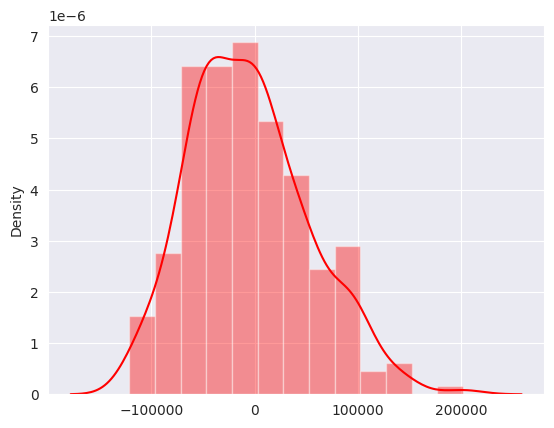

In [261]:
# distplot for (y_test - ridge_model_best_param_prediction) 
sns.distplot((y_test - ridge_model_best_param_prediction), color="red") 

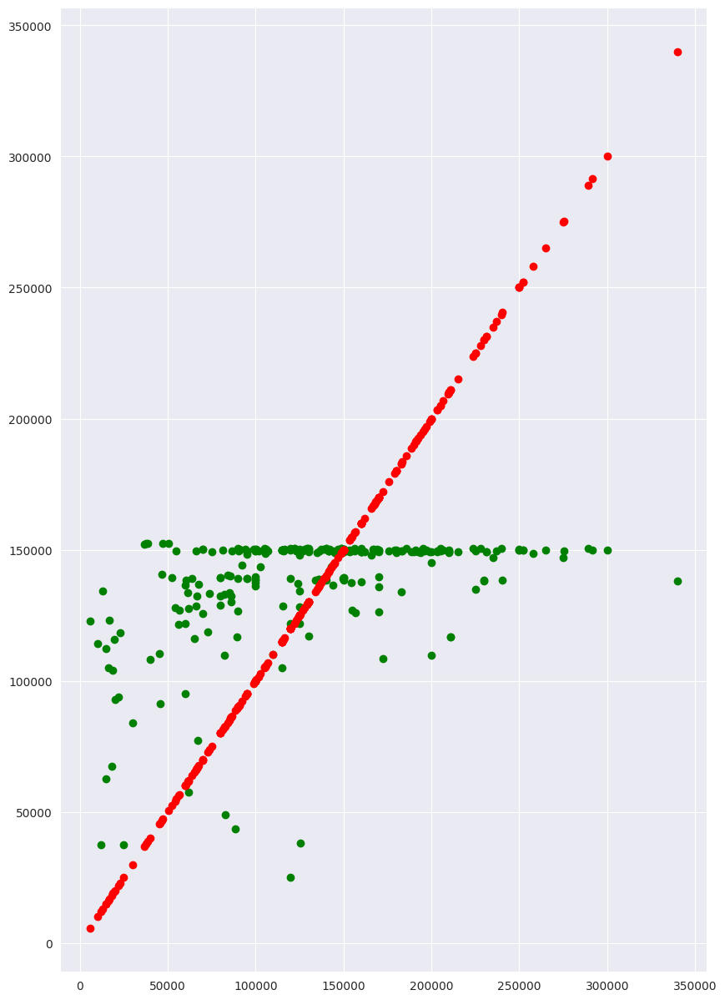

In [262]:
# Graph for checking outlier 
plt.figure(figsize=(10,15))
plt.scatter(y_test, ridge_model_best_param_prediction, color="green") 
plt.scatter(y_test, y_test, color="red")    

### 14.6 Prediction with Actual test data

In [263]:
# predict with actual test data
ridge_model_best_param_prediction = ridge_model_best_param.predict(test_copy)  
ridge_model_best_param_prediction

/home/moni/.local/lib/python3.10/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but Ridge was fitted without feature names
  warnings.warn(


array([149119.82200892, 149975.00670093, 149119.82200892, ...,
       128701.12749123, 149588.94377116, 149975.00670093])

### 14.7 Preparing Submission File

In [264]:
# preparing submission file
def prepare_submission_file(sample_submission): 
    submission_file = pd.read_csv(sample_submission)
    UID_array = np.array(submission_file['UID'])
    submission_df = pd.DataFrame({'UID': UID_array, 'y': ridge_model_best_param_prediction})  
    return submission_df 

In [265]:
# calling the prepare_submission_file function
submission_file = prepare_submission_file("/home/moni/Senior ML Competition/sample_submission.csv")
submission_file.to_csv("/home/moni/Senior ML Competition/ridge_regression_predicted_result_file.csv", index=False)  
submission_file.head() 

,UID,y
0,2628,149119.822009
1,2629,149975.006701
2,2630,149119.822009
3,2631,136615.193940
4,2632,149119.822009


# 15. Using KNN Model with Hyperparameter Tuning

In [267]:
from math import sqrt

from sklearn.preprocessing import MinMaxScaler
from sklearn import neighbors 
from sklearn.model_selection import GridSearchCV

### 15.1 Dividing dataset

In [268]:
# Dividing dataset 
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=.1) 

### 15.2 Scaling train and test feature using MinMaxScaler

In [269]:
# Define MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# MinMaxScaler for training data
x_train_scaled = scaler.fit_transform(x_train)
x_train = pd.DataFrame(x_train_scaled)

# MinMaxScaler for test data 
x_test_scaled = scaler.fit_transform(x_test)
x_test = pd.DataFrame(x_test_scaled)

In [270]:
rmse_val = [] #to store rmse values for different k
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(x_train, y_train)  #fit the model
    pred=model.predict(x_test) #make prediction on test set
    error = sqrt(mean_squared_error(y_test, pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 68214.4802734521
RMSE value for k=  2 is: 59990.21740352066
RMSE value for k=  3 is: 58703.94053491996
RMSE value for k=  4 is: 56871.37678530001
RMSE value for k=  5 is: 55724.97941303449
RMSE value for k=  6 is: 55698.56237367713
RMSE value for k=  7 is: 54658.80141361566
RMSE value for k=  8 is: 54222.06119695243
RMSE value for k=  9 is: 54130.651683825374
RMSE value for k=  10 is: 54750.34466606063
RMSE value for k=  11 is: 54678.44355465473
RMSE value for k=  12 is: 54531.52722559074
RMSE value for k=  13 is: 54762.936120676066
RMSE value for k=  14 is: 54794.58968755694
RMSE value for k=  15 is: 55204.77693991837
RMSE value for k=  16 is: 55541.148246546094
RMSE value for k=  17 is: 55745.82452909602
RMSE value for k=  18 is: 55907.49600755068
RMSE value for k=  19 is: 56142.60411738783
RMSE value for k=  20 is: 55860.822189766855


<AxesSubplot: >

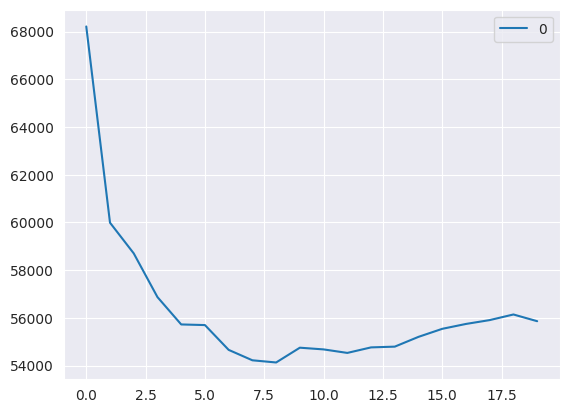

In [271]:
#plotting the rmse values against k values
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot() 

### 15.3 Using GridSearchCV

In [272]:
# Define hyperparameters 
params = {'n_neighbors':[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]}

# Define algorithms 
knn = neighbors.KNeighborsRegressor()

# Define GridSearchCV 
model = GridSearchCV(knn, params, cv=5)
model.fit(x_train, y_train) 
model.best_params_ 

{'n_neighbors': 15}

### 15.4 Training the KNN algorithm with the best K

In [273]:
knn_model = neighbors.KNeighborsRegressor(n_neighbors = 15)
knn_model.fit(x_train, y_train) 

KNeighborsRegressor(n_neighbors=15)

In [274]:
# predict the model with the x_test data 
knn_model_prediction = knn_model.predict(x_test) 
knn_model_prediction 

array([104553.8       , 166693.33333333, 172218.73333333, 189520.        ,
        89510.4       ,  89207.06666667, 106233.53333333,  82137.        ,
       103913.33333333, 140313.13333333, 137714.        , 154360.        ,
       137714.        , 154360.        , 148144.73333333, 137714.        ,
       168196.66666667, 110499.8       , 160576.66666667, 173054.        ,
       154360.        , 202273.33333333, 170354.        ,  57863.93333333,
        52628.93333333, 137714.        , 166693.33333333, 145399.26666667,
       160576.66666667, 189520.        , 189520.        , 166693.33333333,
       103913.33333333, 129437.8       , 202273.33333333, 154360.        ,
       248928.53333333,  97961.2       , 123264.46666667, 116333.33333333,
       202273.33333333, 133114.93333333, 166693.33333333, 154360.        ,
       171463.46666667, 137714.        , 154360.        , 154360.        ,
       154360.        , 152297.93333333, 113392.2       , 137714.        ,
       154360.        , 1

### 15.5 Predicting and Evaluation of the Model's Performance

In [275]:
# find mean absolute error
print("Predictions of knn Regression:", mean_absolute_error(y_test, knn_model_prediction))  
 
# find variance score
print("The Variance Score :", explained_variance_score(y_test, knn_model_prediction))

Predictions of knn Regression: 41166.04131812421
The Variance Score : 0.2665010852816033


/tmp/ipykernel_7426/1754563605.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((y_test - knn_model_prediction), color="red")


<AxesSubplot: ylabel='Density'>

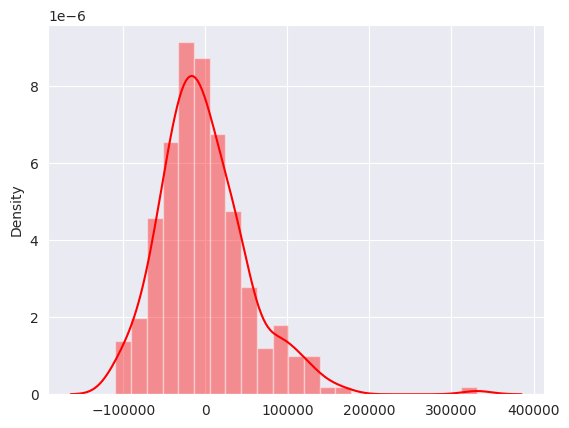

In [276]:
# distplot for (y_test - ridge_model_best_param_prediction) 
sns.distplot((y_test - knn_model_prediction), color="red")  

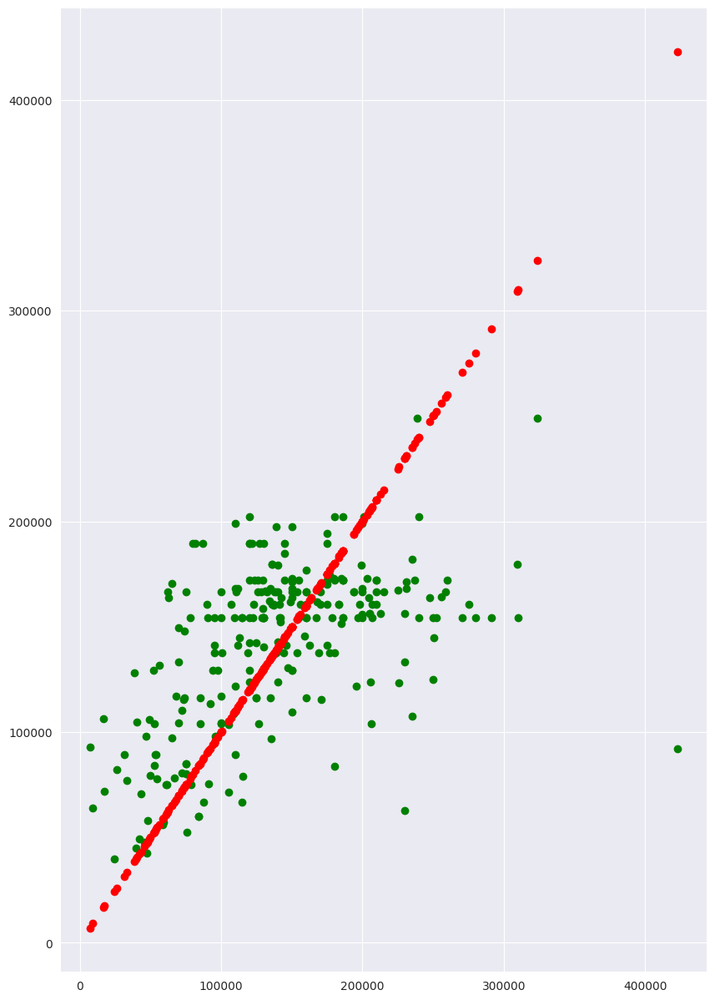

In [277]:
# Graph for checking outlier 
plt.figure(figsize=(10,15))
plt.scatter(y_test, knn_model_prediction, color="green") 
plt.scatter(y_test, y_test, color="red")    

##### so many outliers are detected. so we need to drop outlier from features for best model 

### 15.6 Prediction with the Actual Test data

In [278]:
# predict with actual test data
knn_model_best_param_prediction = knn_model.predict(test_copy)  
knn_model_best_param_prediction 

/home/moni/.local/lib/python3.10/site-packages/sklearn/base.py:443: UserWarning: X has feature names, but KNeighborsRegressor was fitted without feature names
  warnings.warn(


array([120544.13333333, 134328.13333333, 120544.13333333, ...,
       107425.6       , 107257.06666667, 134328.13333333])

### 15.7 Preparing Submission File

In [279]:
# preparing submission file
def prepare_submission_file(sample_submission): 
    submission_file = pd.read_csv(sample_submission)
    UID_array = np.array(submission_file['UID'])
    submission_df = pd.DataFrame({'UID': UID_array, 'y': knn_model_best_param_prediction})  
    return submission_df 

In [280]:
# calling the prepare_submission_file function
submission_file = prepare_submission_file("/home/moni/Senior ML Competition/sample_submission.csv")
submission_file.to_csv("/home/moni/Senior ML Competition/knn_regression_predicted_result_file.csv", index=False)  
submission_file.head() 

,UID,y
0,2628,120544.133333
1,2629,134328.133333
2,2630,120544.133333
3,2631,117789.200000
4,2632,120544.133333


# 16. Limitation of this Project

#### 1. Scarcity of data in the dataset 
#### 2. Short Time (given dataset is messy data. Need more and more time for best feature engineering)

# 17. How to Increase Accuracy

#### 1. Increase the number of data.
#### 2. Drop the Outlier (I didn't drop the outlier because of the small dataset). 
#### 3. Drop the Duplicate data (I didn't drop duplicate data because of the small dataset). 
#### 4. Test with Different Regression Machine Learning Model and Choose the best one for example Bayesian Linear Regression, Polynomial Regression, Lasso Regression, SVM. 
#### 5. Use Skopt, Optuna Libraries for Hyperparameter Tuning. 
#### 6. Increase the Number of Features and choose the most correlated features for training. 
#### 7. Use Tensorflow Keras Tuner for Hyperparameter Tuning of Deep Neural Network. 